# Part B

In [1]:
using Pkg
Pkg.activate(".")

  Activating project at `d:\Testing_environment\Julia`


In [2]:
Pkg.add(["MarketData", "Dates", "DataFrames", "Statistics", "Plots", "StatsBase", "Distributions", "StatsPlots", 
"Images", "PrettyTables", "ARCHModels", "Flux", "LinearAlgebra", "GLM", "MLUtils", "MLDataUtils", "Optim"])

   Resolving package versions...
  No Changes to `D:\Testing_environment\Julia\Project.toml`
  No Changes to `D:\Testing_environment\Julia\Manifest.toml`
Precompiling project...
   3434.7 ms  ✓ Clustering
   4625.2 ms  ✓ StatsModels
   4755.9 ms  ✓ Optim
   7383.3 ms  ✓ Distributions
   2155.0 ms  ✓ Distributions → DistributionsTestExt
   2162.1 ms  ✓ Distributions → DistributionsChainRulesCoreExt
   6965.0 ms  ✓ ImageSegmentation
  11028.5 ms  ✓ MLUtils
  14332.1 ms  ✓ ImageCorners
   3916.6 ms  ✓ HypothesisTests
   3374.3 ms  ✓ MultivariateStats
   3140.0 ms  ✓ KernelDensity
   3860.5 ms  ✓ GLM
   3772.9 ms  ✓ MLDataDevices → MLDataDevicesMLUtilsExt
   7545.3 ms  ✓ Images
   8429.0 ms  ✓ Flux
  27287.1 ms  ✓ ARCHModels
  72287.4 ms  ✓ Plots
   5181.0 ms  ✓ Plots → FileIOExt
   5429.4 ms  ✓ Plots → UnitfulExt
   7167.4 ms  ✓ StatsPlots
  21 dependencies successfully precompiled in 96 seconds. 460 already precompiled.


In [3]:
using Pkg, MarketData, Dates, DataFrames, Statistics, StatsBase, ARCHModels, Flux, LinearAlgebra, GLM, 
Distributions, PrettyTables, StatsPlots, MLUtils, MLDataUtils, Optim

## 1. Obtaining the data set

In [4]:
data = yahoo(:F, YahooOpt(period1 = DateTime("1998-01-01"), period2 = DateTime("2024-10-26") )) |> DataFrame;
first(data,5)

Row,timestamp,Open,High,Low,Close,AdjClose,Volume
,Date,Float64,Float64,Float64,Float64,Float64,Float64
1,1998-01-02,17.7686,17.8371,17.5633,17.609,7.15526,5.32288e6
2,1998-01-05,17.609,17.7002,17.4493,17.7002,7.19234,7.01269e6
3,1998-01-06,17.609,17.609,17.1528,17.4037,7.07185,7.45631e6
4,1998-01-07,17.2896,17.3809,16.9019,17.1984,6.98843,9.09872e6
5,1998-01-08,16.9019,17.0159,16.4001,16.4457,6.68257,9.75305e6


## 2. Calculating the HAR regressors

For the realized volatility we implemented the close-to-close, Parkinson, Garman-Klass, and Rogers-Sastchell estimators as substitutes of the high frequency realized volatility measures. This in order to reduce complexity and due to technical difficulties with the packages for downloading high frequency data.

The construction of each estimate is guided by the mathematical computations of the volatility for each date via:
1. Standard close-to-close $\sigma_i = \sqrt{\frac{1}{T} \cdotp (ln\_ret_i - \mathbb{E}\left[ ln\_ret \right])^2}$
2. Parkinson $\sigma_i = \sqrt{\frac{1}{4 T \ln 2} \left(\ln \frac{h_i}{l_i}\right)^2}$
3. Garman-Klass $\sigma_i = \sqrt{\frac{1}{2T}\left(\ln \frac{h_i}{l_i}\right)^2-\frac{(2 \ln 2-1)}{T} \left(\ln \frac{c_i}{c_{i-1}}\right)^2}$
4. Rogers-Satchell $\sigma_i =\sqrt{\frac{1}{T} \left(\ln \frac{h_i}{c_i}\right)\left(\ln \frac{h_i}{o_i}\right)+\left(\ln \frac{l_i}{c_i}\right)\left(\ln \frac{l_i}{o_i}\right)}$

Where T represents the total sizze of the sample, $h_i$ highest price during day i, $l_i$ lowest price during day i, $o_i$ opening price for day i, and $c_i$ closing price for day i.

In [5]:
#Functions for the estimation of realized volatility using multiple approaches
function standard_close(data, T=1) # receives a standard yahoo finance dataframe
	ret = diff(log.(data[:, 5], data[:, 2]))
	mean = sum(ret)/length(ret)
    return sqrt.(1/T .* (ret .- mean).^2)
end

function parkinson(data, T=1) # receives a standard yahoo finance dataframe
    return sqrt.((1/(4*T*log(2))) .* log.((data[:,3]./data[:,4])).^2)
end

function garman_klass(data, T=1) # receives a standard yahoo finance dataframe
    return sqrt.(((1/(2*T)) .* log.((data[:,3]./data[:,4])).^2) - ((2*log(2)-1)/T)*(log.(data[:,5]./data[:,2])).^2)
end

function rogers_satchell(data, T=1) # receives a standard yahoo finance dataframe
    return sqrt.(1/T .* log.(data[:,3]./data[:,5]) .* log.(data[:,3]./data[:,2]) + log.(data[:,4]./data[:,5]) .* log.(data[:,4]./data[:,2]))
end

rogers_satchell (generic function with 2 methods)

In [6]:
#Function for estimating the HAR regressors
function HAR_regressors(data0)
	#Days
    RVd = data0[22:end-1] #Lagged Return

	#Weeks
    RVw = zeros(length(RVd))
    for i in 22:(length(data0)-1)
       temp = 0
       for h in 0:4
           temp = temp + data0[i-h]
       end
       RVw[i-21]= temp / 5 #Weekly weighted average 
    end
    
	#Months
    RVm = zeros(length(RVd)) 
    for i in 22:(length(data0)-1) 
       temp = 0
       for h in 0:21
           temp = temp + data0[i-h]
       end
       RVm[i-21] = temp / 22; #Monthlyy weighted average 
    end

    return [RVd RVw RVm]
end

HAR_regressors (generic function with 1 method)

In [7]:
#Estimating the volatility based on multiple methods
stand_estim = standard_close(data)
park_estim = parkinson(data)
garm_estim = garman_klass(data)
rog_estim = rogers_satchell(data)

#Regressors
stand_reg = DataFrame([(stand_estim[23:end]) HAR_regressors(stand_estim)], [:rv, :rv_d, :rv_w, :rv_m])
park_reg = DataFrame([(park_estim[23:end]) HAR_regressors(park_estim)], [:rv, :rv_d, :rv_w, :rv_m])
garm_reg = DataFrame([(garm_estim[23:end]) HAR_regressors(garm_estim)], [:rv, :rv_d, :rv_w, :rv_m])
rog_reg = DataFrame([(rog_estim[23:end]) HAR_regressors(rog_estim)], [:rv, :rv_d, :rv_w, :rv_m]);

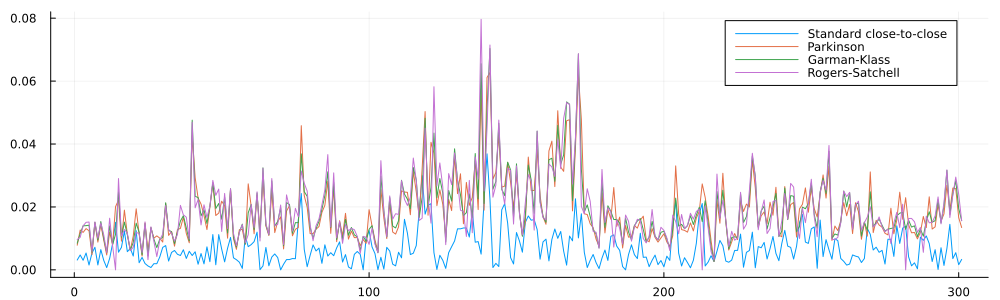

In [8]:
#Plotting and comparing volatilities
plot(stand_reg[6:306, 1], size=(1000,300), label = "Standard close-to-close")
plot!(park_reg[6:306, 1], label = "Parkinson")
plot!(garm_reg[6:306, 1], label = "Garman-Klass")
plot!(rog_reg[6:306, 1], label = "Rogers-Satchell")


From the graph we can deduce that the Standard close-to-close is the measure that shows the lowest volatility. However, this represents a disadvantage taking into account that the other three estimates point towards a larger volatility.

Regarding to the other more reliable estimates, we can observe that the Parkinson and Rogers-Satchell are the methods which capture in a more notorious manner peeks and plunges in terms of volatility, making them the preferred alternatives for this moment.

**HAR regressors for Parkinson**

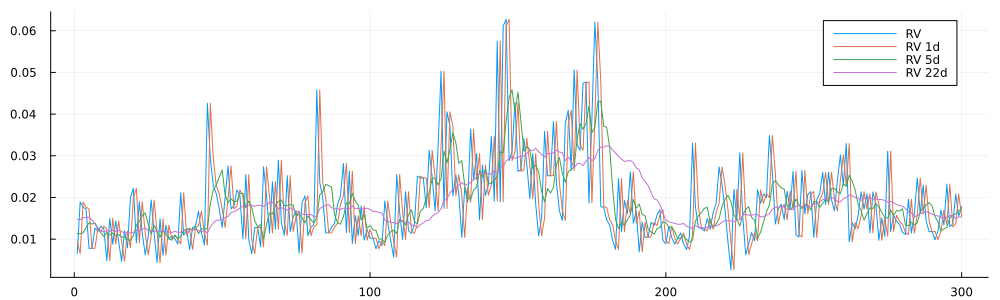

In [9]:
plot(park_reg[1:300, 1], size=(1000,300), label = "RV")
plot!(park_reg[1:300, 2], label = "RV 1d")
plot!(park_reg[1:300, 3], label = "RV 5d")
plot!(park_reg[1:300, 4], label = "RV 22d")

**HAR regressors for Rogers-Satchell**

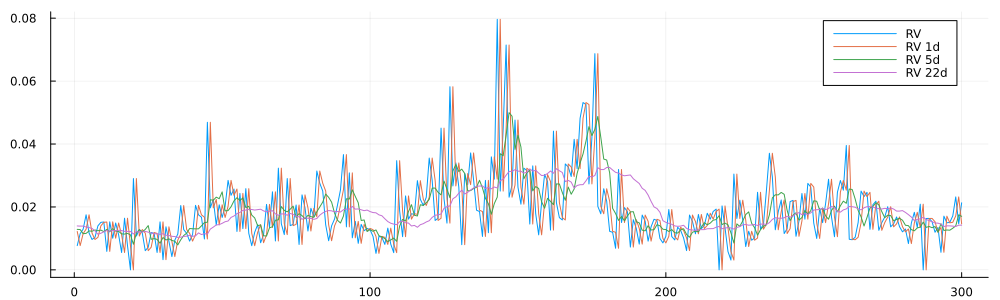

In [10]:
plot(rog_reg[1:300, 1], size=(1000,300), label = "RV")
plot!(rog_reg[1:300, 2], label = "RV 1d")
plot!(rog_reg[1:300, 3], label = "RV 5d")
plot!(rog_reg[1:300, 4], label = "RV 22d")

From the plots we can conclude that by increasing the number of lags included in the weighted averages, the smoother effect that the series depicts. Therefore, our regressors would be able to capture the short-, mid-, and long-term horizons decisions from investors according to the theory. 

## 2. Calculating the HAR model via OLS

In [11]:
#Obtaining the coefficients, fitted values, and residuals
coef_HAR = []
fit_HAR = []
residuals_HAR = []
for i in [stand_reg, park_reg, garm_reg, rog_reg]
	har_ols = lm(@formula(rv ~ rv_d + rv_w + rv_m), i)

	push!(coef_HAR, coeftable(har_ols).cols[1])
	push!(fit_HAR, predict(har_ols)[1:6725])
	push!(residuals_HAR, (predict(har_ols) - i[:,1])[1:6725])
end

coef_HAR = DataFrame(coef_HAR, [string(:stastand_reg), string(:park_reg), string(:garm_reg), string(:rog_reg)])
fit_HAR = DataFrame(fit_HAR, [string(:stastand_reg), string(:park_reg), string(:garm_reg), string(:rog_reg)])
residuals_HAR = DataFrame(residuals_HAR, [string(:stastand_reg), string(:park_reg), string(:garm_reg), string(:rog_reg)]);

In [12]:
coef_HAR

Row,stastand_reg,park_reg,garm_reg,rog_reg
,Float64,Float64,Float64,Float64
1,0.00156546,0.00189098,0.00203978,0.00224626
2,0.513405,0.329008,0.264786,0.179672
3,0.06842,0.262646,0.279212,0.306233
4,0.264992,0.304995,0.34637,0.3934


In terms of coefficients, the standard close-to-close variation show more unbalanced coefficients compared to the other estimation alternatives. Not so ever, in term of relevance, all the models show that the coefficients for the lagged day and month contribute to the volatility of the asset. Meanwhile, the lagged week is relevant for Parkinson, Garman-Klass, and Rogers-Satchell, but not for the Standard close-to-close.

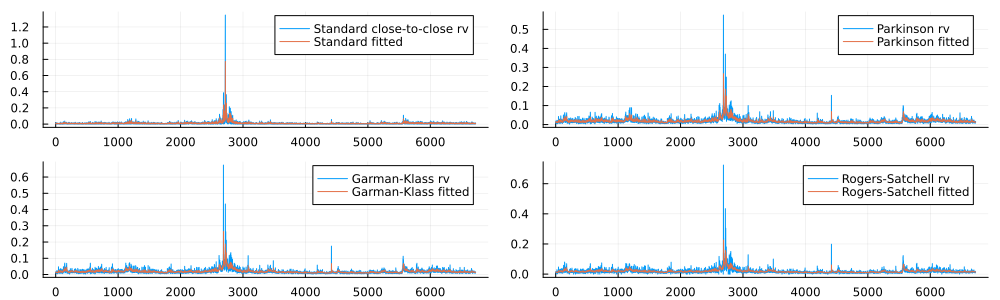

In [13]:
p1 = plot(stand_reg[:,"rv"], size=(1000,300), label = "Standard close-to-close rv")
p1 = plot!(fit_HAR[:,1], size=(1000,300), label = "Standard fitted")

p2 = plot(park_reg[:,"rv"], size=(1000,300), label = "Parkinson rv")
p2 = plot!(fit_HAR[:,2], size=(1000,300), label = "Parkinson fitted")

p3 = plot(garm_reg[:,"rv"], size=(1000,300), label = "Garman-Klass rv")
p3 = plot!(fit_HAR[:,3], size=(1000,300), label = "Garman-Klass fitted")

p4 = plot(rog_reg[:,"rv"], size=(1000,300), label = "Rogers-Satchell rv")
p4 = plot!(fit_HAR[:,4], size=(1000,300), label = "Rogers-Satchell fitted")

plot(p1, p2, p3, p4)

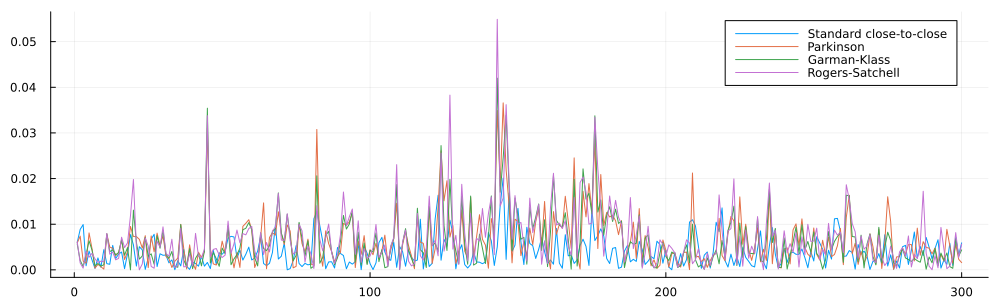

In [14]:
plot(abs.(residuals_HAR[1:300, 1]), size=(1000,300), label = "Standard close-to-close")
plot!(abs.(residuals_HAR[1:300, 2]), label = "Parkinson")
plot!(abs.(residuals_HAR[1:300, 3]), label = "Garman-Klass")
plot!(abs.(residuals_HAR[1:300, 4]), label = "Rogers-Satchell")

In [15]:
println("RMSE Standard close-to-close: ", sqrt(sum(residuals_HAR[:,1].^2)/length(residuals_HAR[:,1])),
"\nRMSE Parkinson: ", sqrt(sum(residuals_HAR[:,2].^2)/length(residuals_HAR[:,2])),
"\nRMSE Garman-Klass: ", sqrt(sum(residuals_HAR[:,3].^2)/length(residuals_HAR[:,3])),
"\nRMSE Rogers-Satchell: ", sqrt(sum(residuals_HAR[:,4].^2)/length(residuals_HAR[:,4])))

RMSE Standard close-to-close: 0.02085639791280327
RMSE Parkinson: 0.011895045637872503
RMSE Garman-Klass: 0.012877879165280952
RMSE Rogers-Satchell: 0.014116275007331883


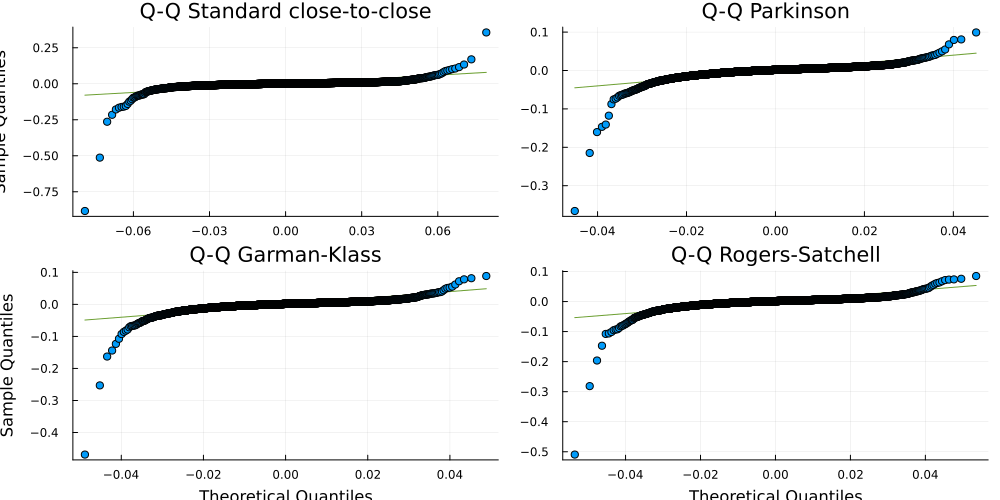

In [16]:
p1 = qqplot(Normal(mean(residuals_HAR[:,1]), std(residuals_HAR[:,1])), residuals_HAR[:,1],  title ="Q-Q Standard close-to-close", ylabel = "Sample Quantiles")
p2 = qqplot(Normal(mean(residuals_HAR[:,2]), std(residuals_HAR[:,2])), residuals_HAR[:,2], title ="Q-Q Parkinson")
p3 = qqplot(Normal(mean(residuals_HAR[:,3]), std(residuals_HAR[:,3])), residuals_HAR[:,3], title ="Q-Q Garman-Klass", xlabel = "Theoretical Quantiles", ylabel = "Sample Quantiles",)
p4 = qqplot(Normal(mean(residuals_HAR[:,4]), std(residuals_HAR[:,4])), residuals_HAR[:,4], title ="Q-Q Rogers-Satchell", xlabel = "Theoretical Quantiles")

plot(p1, p2, p3, p4, size=(1000,500))

In terms of performance based on RMSE, the Parkinson approach had the best performance, followed by Garman-Klass, and Rogers-Satchell. By no surprise, the Standard close-to-close came at last with larger residuals compared to the realized volatility. In spite of this, it is important to highlight that all the models still have some persistent volatility that is not being absorbed by the model and that can be assessed by a brief view of the absolute value of its residuals.

**Assessing the performance of the best model in unseen data:**

RMSE: 0.61327390588266
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

rv ~ 1 + rv_d + rv_w + rv_m

Coefficients:
─────────────────────────────────────────────────────────────────────────────
                    Coef.  Std. Error      t  Pr(>|t|)   Lower 95%  Upper 95%
─────────────────────────────────────────────────────────────────────────────
(Intercept)  -1.20232e-15  0.00991689  -0.00    1.0000  -0.0194411  0.0194411
rv_d          0.340708     0.0157536   21.63    <1e-98   0.309825   0.371592
rv_w          0.194457     0.0216899    8.97    <1e-18   0.151936   0.236978
rv_m          0.219054     0.0177783   12.32    <1e-33   0.184202   0.253907
─────────────────────────────────────────────────────────────────────────────


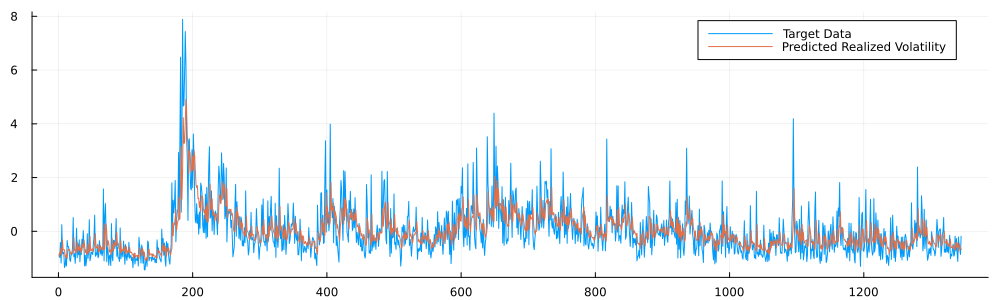

In [32]:
#For Parkinson1
#Tidying the data
train_size = 0.8
x = Matrix(park_reg[:, 2:4])'
y = park_reg[:, 1]'

#Performing train test split
(x_train, y_train), (x_test, y_test) = MLDataUtils.splitobs((x, y), at = train_size)

#Creating transformations for standardizing the samples
fit_xt = StatsBase.fit(ZScoreTransform, x_train; dims=2, center=true, scale=true)
fit_xv = StatsBase.fit(ZScoreTransform, x_test; dims=2, center=true, scale=true)
fit_yt = StatsBase.fit(ZScoreTransform, y_train; dims=2, center=true, scale=true)
fit_yv = StatsBase.fit(ZScoreTransform, y_test; dims=2, center=true, scale=true)

#Transforming the samples
xt_std = StatsBase.transform(fit_xt, x_train)
xv_std = StatsBase.transform(fit_xv, x_test)
yt_std = StatsBase.transform(fit_yt, Matrix(y_train))
yv_std = StatsBase.transform(fit_yv, Matrix(y_test))

#Setting train and test dataframes
tr_data = DataFrame([yt_std' xt_std'], [:rv, :rv_d, :rv_w, :rv_m])
test_data = DataFrame([yv_std' xv_std'], [:rv, :rv_d, :rv_w, :rv_m]) 

#Forecasting
har_ols = lm(@formula(rv ~ rv_d + rv_w + rv_m), tr_data)

predictions_train = predict(har_ols)
predictions = predict(har_ols, test_data[:,2:4])

#Evaluating performance in unseen data
println("RMSE: ", Flux.Losses.mse(predictions, test_data[:,1]))
println(har_ols)

#Plot
plot(test_data[:,1], labels="Target Data", size=(1000, 300))
plot!(predictions, labels="Predicted Realized Volatility")

With this we could say that our model performs in an acceptable manner with a low RMSE. However, it is also evident that it is not able to capture the whole effects of volatility shocks.

## 3. Estimating HAR coefficients with different algorithms - Optim.jl

**For this section we would use the estimator for realized volatility that depicted the best performance. Hence, we would use the Parkinson realized volatility approach for the following iterations**

In [33]:
methods = [NelderMead(), GradientDescent(), BFGS(), Newton()]  # List of optimization algorithms to apply
names = ["NelderMead", "GradientDescent", "BFGS", "Newton"]

#Setting the MSE as the loss function to optimize
data = park_reg
loss_har((m1, m2, m3, m4)) = sum((m1 + m2 * data.rv_d[i] + m3 * data.rv_w[i] + m4 * data.rv_m[i] - data.rv[i])^2 
for i in 1:length(data.rv)) / length(data.rv)

#Coefficient and performance metrics
results = DataFrame(Method=[], ß0 = [], ß1 = [],  ß2 = [], ß3 = [], Iterations=[], Seconds=[])

#Grid with initial parameters
initial_params = [0.0, 0.0, 0.0, 0.0]

# Loop through optimization methods
for (name, method) in zip(names, methods)
    elapsed_time = @elapsed begin
        result = optimize(loss_har, initial_params, method, autodiff=:forward)
    end

    elapsed_time = round.(elapsed_time, digits = 4)
    par1 = result.minimizer[1]
    par2 = result.minimizer[2]
    par3 = result.minimizer[3]
    par4 = result.minimizer[4]
    method_name = names
    num_iterations = result.iterations

    push!(results, (name, par1, par2, par3, par4, num_iterations, elapsed_time)) #Pushing the results

end

#Setting OLS estimation as the base comparison model
elapsed_time_ols = @elapsed begin
    har = lm(@formula(rv ~ rv_d + rv_w + rv_m), data)
end
push!(results, ("OLS", coef(har)[1], coef(har)[2], coef(har)[3], coef(har)[4],  "None", round.(elapsed_time_ols, digits = 4))) # GLM package uses closed-form OLS solution for usual linear models like the one we used

#Deploying the results
results

Row,Method,ß0,ß1,ß2,ß3,Iterations,Seconds
,Any,Any,Any,Any,Any,Any,Any
1,NelderMead,0.00210944,0.276146,0.38987,0.217072,104,0.8528
2,GradientDescent,0.00189154,0.32895,0.262868,0.3048,223,4.867
3,BFGS,0.00189098,0.329008,0.262646,0.304995,5,0.1332
4,Newton,0.00189098,0.329008,0.262646,0.304995,1,0.1586
5,OLS,0.00189098,0.329008,0.262646,0.304995,None,0.0004


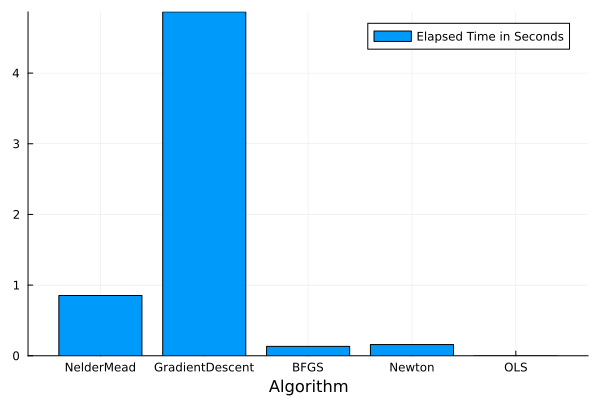

In [34]:
bar(results.Method[:], results.Seconds[:], label = "Elapsed Time in Seconds", xlabel = "Algorithm")

From our output we can conclude that the Newton (Hessian-Based Second Order) algorithm and the Broyden-Fletcher-Goldfarb-Shanno algorithm (Gradient-Based) reached the same solution as our HAR OLS. Nevertheless, both of them involve a larger computational time and BFGS shows that requires a larger number of epochs to converge to the solution.

On the other hand, the Gradient Descent diverge in the coefficients by some units form the already mentioned approaches. However, its computational time and number of iterations until convergence are remarkably high. Meanwhile, NelderMead (Derivative-Free) estimated lower coefficients for the day and month lags compared to the other algorithms but increased the proportion of the estimate for the week lag.

Finally, as a general conclusion for this initial exercise, none of the ML approaches (at least without regularization or parameters tunning) is able to compete with the HAR-OLS based on the computational time and optimal solution.

## 4. Estimating HAR coefficients with NN - Flux.jl

**For this section we would use once more the estimator for realized volatility that depicted the best performance in the first stage of this analysis. Hence, we would use the Parkinson realized volatility approach for the following iterations with the values standardized**

In [35]:
#Standardizing the data and applying a train test split
#Tidying the data
train_size = 0.8
x = Matrix(park_reg[:, 2:4])'
y = park_reg[:, 1]'

#Performing train test split
(x_train, y_train), (x_test, y_test) = MLDataUtils.splitobs((x, y), at = train_size)

#Creating transformations for standardizing the samples
fit_xt = StatsBase.fit(ZScoreTransform, x_train; dims=2, center=true, scale=true)
fit_xv = StatsBase.fit(ZScoreTransform, x_test; dims=2, center=true, scale=true)
fit_yt = StatsBase.fit(ZScoreTransform, y_train; dims=2, center=true, scale=true)
fit_yv = StatsBase.fit(ZScoreTransform, y_test; dims=2, center=true, scale=true)

#Transforming the samples
xt_std = StatsBase.transform(fit_xt, x_train)
xv_std = StatsBase.transform(fit_xv, x_test)
yt_std = StatsBase.transform(fit_yt, Matrix(y_train))
yv_std = StatsBase.transform(fit_yv, Matrix(y_test))

#Spliting once more the training set for obtaining a validation samples
(x_train, y_train), (x_val, y_val) = MLDataUtils.splitobs((xt_std , yt_std), at = train_size)

#This sub split leave us with a 64% (training), 16% (validation), and 20% (testing) structure.
tr_data = DataFrame([y_train' x_train'], [:rv, :rv_d, :rv_w, :rv_m])
val_data = DataFrame([y_val' x_val'], [:rv, :rv_d, :rv_w, :rv_m])
test_data = DataFrame([yv_std' xv_std'], [:rv, :rv_d, :rv_w, :rv_m]);

Now, taking into account that we would try to minimize the MSE. We would do the estimation via OLS for the three partitions to have consistent and comparable estimations.

In [36]:
#OLS with the training data
har_ols = lm(@formula(rv ~ rv_d + rv_w + rv_m), tr_data)

#Predictions
predict_train = predict(har_ols)
predict_val = predict(har_ols, val_data[:, 2:4])
predict_test = predict(har_ols, test_data[:, 2:4])

#Capturing the MSE
mse_ols_tr = Flux.Losses.mse(predict_train, tr_data[:,1])
mse_ols_v = Flux.Losses.mse(predict_val, val_data[:,1])
mse_ols_tt = Flux.Losses.mse(predict_test, test_data[:,1])

#Unifying on the same data frame
results_OLS = DataFrame(Method=String[], TrainLoss=Float64[], ValidLoss=Float64[], TestLoss=Float64[])
push!(results_OLS, ("MSE OLS", round(mse_ols_tr, digits = 6), round(mse_ols_v, digits = 6), round(mse_ols_tt, digits = 6)))

results_OLS

Row,Method,TrainLoss,ValidLoss,TestLoss
,String,Float64,Float64,Float64
1,MSE OLS,0.62474,0.145577,0.613208


### Feedforward Neural Nerworks

In [37]:
#Activation functions to try:
a_sigmoid(x) = 1 / (1 + exp(-x)) # Sigmoid
a_relu(x) = maximum(x, 0) # ReLU
a_tanh(x) = (exp(x) - exp(-x))/(exp(x) + exp(-x)); # tanh

In [38]:
beach = nothing
beach !== nothing 

false

In [46]:
#Neural Network function
function nn(x_train, y_train, x_valid, y_valid; nodes=[5,2], eta=0.001, n_epochs=100, act_fct=identity, drop = 0.0)
    
    #Model definition
    neural_net = Chain(
                        Dense(size(x_train,1),  nodes[1]), Dropout(drop),
                        Dense(nodes[1], nodes[2], act_fct), Dropout(drop),
                        Dense(nodes[2], size(y_train,1), act_fct),
    )
    
    #Loss function
    loss(x, y) = Flux.Losses.mse(neural_net(x), y)
    
    #Performance metric
    loss1(x, y) = Flux.Losses.mse(neural_net(x), y)

    #Optimization
    opt = Descent(eta) #Optimization applying gradient descent
    # opt = ADAM(eta)
    
    # _ params 
    my_params = Flux.params(neural_net) # takes the parameters of the neural net, the weights and biases in every layer.
    orig_params = deepcopy(my_params) # Using deepcopy()to create a deep copy of a data structure, which means it creates a new instance of the data structure with a completely independent copy of its contents.
    
    best_mse_val_loss = Inf
    best_mse_val_tr_loss = Inf
    best_model = deepcopy(neural_net)

    # _ reporting 
    mse_losses_train = []
    mse_losses_valid = []
    
    # _ Train loop over the data
    for epoch in 1:n_epochs # 100 iterations here
        # training
        Flux.train!(loss, my_params, [(x_train, y_train)], opt) #Optimization using the full sample

        push!(mse_losses_train, loss1(x_train, y_train)) # computes the loss for every iteration of the training data set
        push!(mse_losses_valid, loss1(x_valid, y_valid)) # computes the loss for every iteration of the validaton data set
        
        # saving the best model and the lowest mse/mae 
        if best_mse_val_loss > mse_losses_valid[end]
            best_model = deepcopy(neural_net)
            best_mse_val_loss = mse_losses_valid[end]
            best_mse_val_tr_loss = mse_losses_train[end] # mse on the training data corresponding to the lowest mse on the validation data
        else
        end 

        epoch % 20 == 0 ? println("Epoch $epoch \t Loss: ", mse_losses_train[end], " \t Test: ", mse_losses_valid[end]) : nothing
    end
    
    return neural_net, best_model, best_mse_val_tr_loss, best_mse_val_loss, mse_losses_train, mse_losses_valid
end;

In [47]:
results_act = DataFrame(ActivationFunction=String[], Loss1=Float64[], Loss2=Float64[])
best_models = Vector{Chain}(undef, 0)
activation_functions = [identity, a_sigmoid, a_tanh, leakyrelu, relu]

# Later renaming the losses here
for act_fct in activation_functions
    model_trained01, best_model_trained_01, b_losses01, b_losses02, losses01, losses02 = nn(x_train, y_train, x_val, y_val; nodes=[100,100], eta=0.01, n_epochs = 1000, act_fct=act_fct, drop = 0.0) 
    push!(results_act, (string(act_fct), round(b_losses01[end], digits= 6), round(b_losses02[end], digits = 6)))
    push!(best_models, best_model_trained_01)
    Flux.reset!(model_trained01)
end
results_act = permutedims(results_act,  [:identity, :a_sigmoid, :a_tanh, :leakyrelu, :relu])
results_act = results_act[2:3,:]
results_act.NewColumn = ["MSE-FFNN-Train", "MSE-FFNN-Val"]
select!(results_act, ncol(results_act), :)
results_act

Epoch 20 	 Loss: 0.6285255598826708 	 Test: 0.1483306765569725
Epoch 40 	 Loss: 0.6256752353993398 	 Test: 0.14608252464011737
Epoch 60 	 Loss: 0.6250201022537745 	 Test: 0.14559374078413365
Epoch 80 	 Loss: 0.6248321647215754 	 Test: 0.14550066931404582
Epoch 100 	 Loss: 0.6247715428147673 	 Test: 0.14550331033645775
Epoch 120 	 Loss: 0.6247509574783975 	 Test: 0.1455237185876593
Epoch 140 	 Loss: 0.6247439070266722 	 Test: 0.14554223606283614
Epoch 160 	 Loss: 0.6247413832840426 	 Test: 0.1455554264850783
Epoch 180 	 Loss: 0.6247405194713794 	 Test: 0.1455640043066205
Epoch 200 	 Loss: 0.6247402559321251 	 Test: 0.1455694207066079
Epoch 220 	 Loss: 0.6247401393154651 	 Test: 0.14557261888177872
Epoch 240 	 Loss: 0.624740097674113 	 Test: 0.14557457765909448
Epoch 260 	 Loss: 0.624740082389198 	 Test: 0.14557572989116718
Epoch 280 	 Loss: 0.6247400798487959 	 Test: 0.14557643722492233
Epoch 300 	 Loss: 0.6247400888286356 	 Test: 0.14557685431761994
Epoch 320 	 Loss: 0.6247400864392542

Row,NewColumn,identity,a_sigmoid,a_tanh,leakyrelu,relu
,String,Any,Any,Any,Any,Any
1,MSE-FFNN-Train,0.624803,0.933977,0.866803,0.855028,1.1704
2,MSE-FFNN-Val,0.145497,0.343058,0.142256,0.314122,0.317434


From the estimation we can conclude that:
1. As expected, the identity activation functions accomplish the same or a very close performance as the OLS, based on the idea that they have the same activation function.
2. The NN with the best validation performance was the one with the tanh activation function. Not so ever, it depicted a higher MSE in the training data compared to the OLS. Additionally, its performance is not worth enough the complexity of the model.
3. All the remaining models showed a higher MSE compared to the OLS. Thus, in an unregularized scenario, the NN do not have a better performance than the HAR-OLS.

**Now, applying our models to the test data set to find the best out-of-sample model we get that:**

In [48]:
#Using the best models
models = best_models

#Fitting the data to the test data set
results = DataFrame(ActivationFunction=["identity", "a_sigmoid", "a_tanh", "leakyrelu", "relu"], 
Loss1=[Flux.Losses.mse(models[1](xv_std), yv_std), 
		Flux.Losses.mse(models[2](xv_std), yv_std), 
		Flux.Losses.mse(models[3](xv_std), yv_std), 
		Flux.Losses.mse(models[4](xv_std), yv_std), 
		Flux.Losses.mse(models[5](xv_std), yv_std)])

#Merging results in a dataframe
results = permutedims(results, [:identity, :a_sigmoid, :a_tanh, :leakyrelu, :relu])
results = results[2,:]
results

Row,identity,a_sigmoid,a_tanh,leakyrelu,relu
,Any,Any,Any,Any,Any
2,0.614748,0.82542,0.695003,0.81926,1.00106


Aligned with our previous observations, we get that the identity activation function is the one that delivers the best performance, which it is also the same that characterises the OLS approach. The second-best performer in out-of-sample conditions is tanh. However, there is no improvement in the MSE, meaning that for our series it is not justified the complexity of adopting this or the other remaining variants.

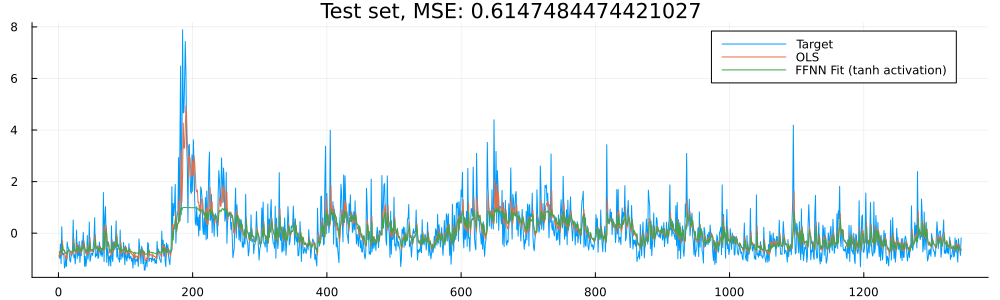

In [49]:
plot(yv_std', labels= "Target", size=(1000, 300), title="Test set, MSE: $(Flux.Losses.mse(best_models[1](xv_std),yv_std))")
plot!(predict_test, labels="OLS")
plot!(best_models[3](xv_std)', labels="FFNN Fit (tanh activation)")

From our plot we can highlight that the HAR-OLS captures more accurately the volatility and its peaks. Meanwhile the FFNN has a smoothed effect which shows difficulties for capturing volatility shocks.

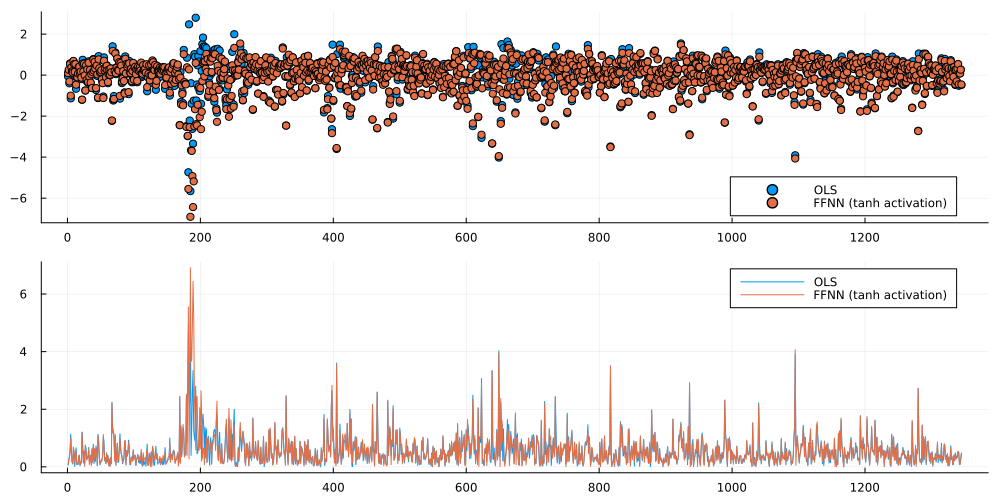

In [50]:
#Reviewing the residuals
residuals_OLS = predict_test - yv_std'
residuals_FFNN = best_models[3](xv_std)' - yv_std'

#Scatter
p1 = plot(residuals_OLS, label="OLS", seriestype=:scatter, size=(1000, 400))
p1 = plot!(residuals_FFNN, label="FFNN (tanh activation)", seriestype=:scatter)

#Persistent volatility
p2 = plot(abs.(residuals_OLS), label="OLS", size=(1000, 500))
p2 = plot!(abs.(residuals_FFNN), label="FFNN (tanh activation)")

plot(p1, p2, layout=(2, 1))

From an analysis of the residuals we can identify that the HAR-OLS reacts better to shocks than the FFNN, which shows higher residuals in periods of high volatility. Additionally to that, we can see that in both models there is some persistent volatility that is not being captured by them, being more notorious this behaviour in the FFNN compared to the OLS estimator.

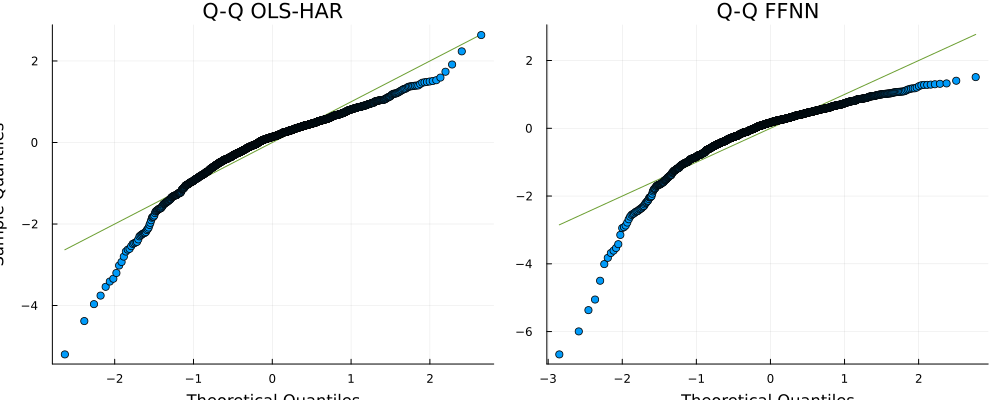

In [51]:
p1 = qqplot(Normal(mean(residuals_OLS[:]), std(residuals_OLS[:])), residuals_OLS[:], title ="Q-Q OLS-HAR", xlabel = "Theoretical Quantiles", ylabel = "Sample Quantiles")
p2 = qqplot(Normal(mean(residuals_FFNN[:]), std(residuals_FFNN[:])), residuals_FFNN[:], title ="Q-Q FFNN", xlabel = "Theoretical Quantiles")

plot(p1, p2, size=(1000,400))

Finally, from our Q-Q plot, we can see that in both cases the residuals are non-normally distributed and that the ones for FFNN are more pronounced with larger negative values.

**Now, implementing lasso regularization**

In [54]:
# Defining Lasso loss function for regularization ----> L1
function l1_loss(neural_net, x, y, λ)
    # Calculate the L1 regularization term
    l1_reg = λ * sum(sum(abs, param) for param in Flux.params(neural_net)) 
    # Calculate the mean squared error loss
    mse_loss = Flux.Losses.mse(neural_net(x), y)
    # Return the total loss
    return mse_loss + l1_reg
end;

function nn_l1(x_train, y_train, x_valid, y_valid; nodes=[5,2], eta=0.001, n_epochs=100, act_fct=identity, λ=0.001, drop = 0.0)
    # _ model
    neural_net = Chain(
                        Dense(size(x_train,1),  nodes[1]), Dropout(drop),
                        Dense(nodes[1], nodes[2], act_fct), Dropout(drop),
                        Dense(nodes[2], size(y_train,1), act_fct),
    )
    
    # _ loss
    loss(x, y) = l1_loss(neural_net, x, y, λ)
    
    # performance metrics
    loss1(x, y) = Flux.Losses.mse(neural_net(x), y)

    # _ optimization
    opt = Descent(eta)
    # _ opt = ADAM(eta)
    
    # _ params 
    my_params = Flux.params(neural_net) # takes the parameters of the neural net, the weights and biases in every layer.
    orig_params = deepcopy(my_params) # In Julia, the deepcopy() function is used to create a deep copy of a data structure, which means it creates a new instance of the data structure with a completely independent copy of its contents. This function is particularly useful when you want to duplicate an object and its nested elements, ensuring that changes to the copied object do not affect the original one.
    
    best_mse_val_loss = Inf
    best_mse_val_tr_loss = Inf
    best_model = deepcopy(neural_net)

    # _ reporting 
    mse_losses_train = []
    mse_losses_valid = []
    
    # _ Train loop over the data
    for epoch in 1:n_epochs # 100 iterations here
        # training
        Flux.train!(loss, my_params, [(x_train, y_train)], opt) # it optimized over the whole batch here, no single data points or minibatches used here
        # reporting
        push!(mse_losses_train, loss1(x_train, y_train)) # computes the loss for every iteration of the training data set
        push!(mse_losses_valid, loss1(x_valid, y_valid)) # # computes the loss for every iteration of the validaton data set

        # saving the best model and the lowest mse/mae 
        if best_mse_val_loss > mse_losses_valid[end]
        best_model = deepcopy(neural_net)
        best_mse_val_loss = mse_losses_valid[end]
        best_mse_val_tr_loss = mse_losses_train[end] # mse on the training data corresponding to the lowest mse on the validation data
        else

        end 
        epoch % 20 == 0 ? println("Epoch $epoch \t Loss: ", mse_losses_train[end], " \t Test: ", mse_losses_valid[end]) : nothing
    end
    
    return neural_net, best_model, best_mse_val_tr_loss, best_mse_val_loss, mse_losses_train, mse_losses_valid
end;

**$\lambda = 0.01$**

In [60]:
results_act2 = DataFrame(ActivationFunction=String[], Loss1=Float64[], Loss2=Float64[])
best_models2 = Vector{Chain}(undef, 0)
activation_functions = [identity, a_sigmoid, a_tanh, leakyrelu, relu]

#
for act_fct in activation_functions
    model_trained03, best_model_trained_03, b_losses05, b_losses06, losses05, losses06 = nn_l1(x_train, y_train, x_val, y_val; nodes=[100,100], eta=0.01, n_epochs=1000, act_fct=act_fct, drop = 0.0, λ = 0.01) 
    push!(results_act2, (string(act_fct), round(b_losses05[end], digits= 6), round(b_losses06[end], digits = 6)))
    push!(best_models2, best_model_trained_03)
    Flux.reset!(model_trained03)
end

results_act2 = permutedims(results_act2,  [:identity, :a_sigmoid, :a_tanh, :leakyrelu, :relu])
results_act2 = results_act2[2:3,:]
results_act2.NewColumn = ["MSE-FFNN-L1-Train", "MSE-FFNN-L1-Val"]
select!(results_act2, ncol(results_act2), :)
results_act2

Epoch 20 	 Loss: 0.6348698951996514 	 Test: 0.14665233270094655
Epoch 40 	 Loss: 0.628118206976173 	 Test: 0.14609398449206426
Epoch 60 	 Loss: 0.6261085540077158 	 Test: 0.14576590740714815
Epoch 80 	 Loss: 0.625364429806503 	 Test: 0.14559975341148132
Epoch 100 	 Loss: 0.6250614685447713 	 Test: 0.14548534931211485
Epoch 120 	 Loss: 0.6249414791852907 	 Test: 0.1454275515366623
Epoch 140 	 Loss: 0.6248885234180835 	 Test: 0.14537979516182487
Epoch 160 	 Loss: 0.6248646804083658 	 Test: 0.14537104471455578
Epoch 180 	 Loss: 0.624858506721784 	 Test: 0.14536661043530513
Epoch 200 	 Loss: 0.6248583190082384 	 Test: 0.14536512360918122
Epoch 220 	 Loss: 0.6248663775636116 	 Test: 0.14536093700159777
Epoch 240 	 Loss: 0.6248749957857769 	 Test: 0.14537572509304816
Epoch 260 	 Loss: 0.6248884409479459 	 Test: 0.14537075798728855
Epoch 280 	 Loss: 0.6248977037199351 	 Test: 0.145418428525805
Epoch 300 	 Loss: 0.6249149531600043 	 Test: 0.1454416504760792
Epoch 320 	 Loss: 0.6249287253131267

Row,NewColumn,identity,a_sigmoid,a_tanh,leakyrelu,relu
,String,Any,Any,Any,Any,Any
1,MSE-FFNN-L1-Train,0.624863,1.06118,0.869632,1.01855,0.678896
2,MSE-FFNN-L1-Val,0.145332,0.43805,0.141332,0.315457,0.317468


From the estimation we can conclude that an estimation with regularization L1 (lasso), $\lambda$ = 0.01 shows:
1. The NN with the identity activation function continues showing the best performance in the training data. However, in this occasion, relu is the second-best performer, moving tanh to the third position.
2. Regarding to the validation set, the best performers continue being tanh followed by identity.
3. The penalty had a slightly positive impact in the validation set for the identity estimation. However, it had a mute negative impact for it in the training set, and more accentuate for leakyrelu and sigmoid.

In [61]:
#Using the best models
models = best_models2

#Fitting the data to the test data set
results = DataFrame(ActivationFunction=["identity", "a_sigmoid", "a_tanh", "leakyrelu", "relu"], 
Loss1=[Flux.Losses.mse(models[1](xv_std), yv_std), 
		Flux.Losses.mse(models[2](xv_std), yv_std), 
		Flux.Losses.mse(models[3](xv_std), yv_std), 
		Flux.Losses.mse(models[4](xv_std), yv_std), 
		Flux.Losses.mse(models[5](xv_std), yv_std)])

#Merging results in a dataframe
results = permutedims(results, [:identity, :a_sigmoid, :a_tanh, :leakyrelu, :relu])
results = results[2,:]
results

Row,identity,a_sigmoid,a_tanh,leakyrelu,relu
,Any,Any,Any,Any,Any
2,0.611304,0.944802,0.702045,0.907218,0.717823


Regarding to the out-of-sample performance, only the identity and relu estimates showed and improvement. Nevertheless, it is so minimal that it does not justify the complexity of the model. Thus, under this specification the HAR-OLS continues being the best model for the series.

**$\lambda = 0.1$**

In [62]:
results_act3 = DataFrame(ActivationFunction=String[], Loss1=Float64[], Loss2=Float64[])
best_models3 = Vector{Chain}(undef, 0)
activation_functions = [identity, a_sigmoid, a_tanh, leakyrelu, relu]

#
for act_fct in activation_functions
    model_trained03, best_model_trained_03, b_losses05, b_losses06, losses05, losses06 = nn_l1(x_train, y_train, x_val, y_val; nodes=[100,100], eta=0.01, n_epochs=1000, act_fct=act_fct, drop = 0.0, λ = 0.1) 
    push!(results_act3, (string(act_fct), round(b_losses05[end], digits= 6), round(b_losses06[end], digits = 6)))
    push!(best_models3, best_model_trained_03)
    Flux.reset!(model_trained03)
end

results_act3 = permutedims(results_act3,  [:identity, :a_sigmoid, :a_tanh, :leakyrelu, :relu])
results_act3 = results_act3[2:3,:]
results_act3.NewColumn = ["MSE-FFNN-L1-Train", "MSE-FFNN-L1-Val"]
select!(results_act3, ncol(results_act3), :)
results_act3

Epoch 20 	 Loss: 0.62905473430618 	 Test: 0.1465064028180387
Epoch 40 	 Loss: 0.63708289324771 	 Test: 0.14797370345612681
Epoch 60 	 Loss: 0.6569115222353259 	 Test: 0.15398301767499017
Epoch 80 	 Loss: 0.6975530896428177 	 Test: 0.1669843585578226
Epoch 100 	 Loss: 0.763647284250239 	 Test: 0.18887079478441962
Epoch 120 	 Loss: 0.8605248883641753 	 Test: 0.22073926906924982
Epoch 140 	 Loss: 0.9703510462456484 	 Test: 0.2596808447086501
Epoch 160 	 Loss: 1.0663837325649739 	 Test: 0.29542072562281513
Epoch 180 	 Loss: 1.118052491126667 	 Test: 0.31780464427690763
Epoch 200 	 Loss: 1.1413060472901413 	 Test: 0.3303642664578325
Epoch 220 	 Loss: 1.1518308880150216 	 Test: 0.33743762267787064
Epoch 240 	 Loss: 1.1577756501289012 	 Test: 0.3421481165497772
Epoch 260 	 Loss: 1.161032207328584 	 Test: 0.345097737949735
Epoch 280 	 Loss: 1.1631483781809762 	 Test: 0.3470436627646071
Epoch 300 	 Loss: 1.164165841697515 	 Test: 0.34838219078525234
Epoch 320 	 Loss: 1.164477532906955 	 Test: 0

Row,NewColumn,identity,a_sigmoid,a_tanh,leakyrelu,relu
,String,Any,Any,Any,Any,Any
1,MSE-FFNN-L1-Train,0.629397,1.16823,0.87675,0.811431,0.720334
2,MSE-FFNN-L1-Val,0.145725,0.521108,0.145362,0.314916,0.314946


From the estimation we can conclude that an estimation with regularization L1 (lasso), $\lambda$ = 0.1 shows:
1. A worse performance in all the activating functions but for leakrelu and relu, where it improved the MSE for the train data set for leakrelu and in both partitions for relu.
2. The identity and tanh approaches continue being the best in-training and in-validation performers, respectively.

In [64]:
#Using the best models
models = best_models3

#Fitting the data to the test data set
results = DataFrame(ActivationFunction=["identity", "a_sigmoid", "a_tanh", "leakyrelu", "relu"], 
Loss1=[Flux.Losses.mse(models[1](xv_std), yv_std), 
		Flux.Losses.mse(models[2](xv_std), yv_std), 
		Flux.Losses.mse(models[3](xv_std), yv_std), 
		Flux.Losses.mse(models[4](xv_std), yv_std), 
		Flux.Losses.mse(models[5](xv_std), yv_std)])

#Merging results in a dataframe
results = permutedims(results, [:identity, :a_sigmoid, :a_tanh, :leakyrelu, :relu])
results = results[2,:]
results

Row,identity,a_sigmoid,a_tanh,leakyrelu,relu
,Any,Any,Any,Any,Any
2,0.6057,1.03924,0.702754,0.789271,0.733829


Aligned with the observations of the previous iteration of $\lambda$ we get that the only improvements in the out-of-sample validation were done for the identity and relu estimates, and all the other models had a worsening in their performce. However, once more, the complexity of the model is not justified with significant improvement compared to the HAR-OLS. Finally, it seems that an increment in the penalization metric from the regularization improves the performance of the identity model, hence, a possible hyperparameter tunning could help to improve the performance -it wold not be done due to computing complexities-; however, it is important to make the side note that this comes by the cost of sacrificing performance in the train and validation set.

## 5. Conclusions

Our analysis, which involved a comprehensive comparison of HAR models optimized with various methods and neural networks, both with and without regularization, indicates that the OLS-HAR model provides the most accurate representation of realized volatility for Ford Motor Co. stock prices. In parallel, it is important to illustrate that the Parkinson approach for realized volatility proved to be the most effective approach for capturing intraday volatility based on intra-day data under the absence of high-frequency data with thinner time intervals.

Finally, despite our model capturing some of the volatility of the series, there is still persistency in the moment. Thus, methodologies such as the usage of high frequency data for a more accurate representation of the realized volatility, other type of neural networks, higher order lags, or other models could capture in a more realistic manner those remaining effects.